In [2]:
import os
import random
import time
import collections
import itertools
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pickle
import seaborn as sns

from scipy.stats import entropy
from innvariant_dgl.dataset import ConstructionSequenceDataset, generate_ba_model_construction_sequence, graph_to_construction_sequence, construction_sequence_to_graph, generate_ws_model_construction_sequence
from tqdm import tqdm

In [3]:
cs2graph = construction_sequence_to_graph

In [4]:
with open('deepgg-combined.pkl', 'rb') as read_handle:
    C = pickle.load(read_handle)

In [5]:
keys = list(C.keys())
keys_dfs = [key for key in keys if '_dfs' in key]
keys_bfs = [key for key in keys if '_bfs' in key]
keys_process = [key for key in keys if '_process' in key]
keys_erdos_renyi = [key for key in keys if 'erdos_renyi' in key]
keys_barabasi_albert = [key for key in keys if 'barabasi_albert' in key]
keys_watts_strogatz = [key for key in keys if 'watts_strogatz' in key]
keys_er_and_bfs = [key for key in keys if 'erdos_renyi' in key and '_bfs' in key]
keys_er_and_dfs = [key for key in keys if 'erdos_renyi' in key and '_dfs' in key]
keys_ba_and_bfs = [key for key in keys if 'barabasi_albert' in key and '_bfs' in key]
keys_ba_and_dfs = [key for key in keys if 'barabasi_albert' in key and '_dfs' in key]
keys_ws_and_bfs = [key for key in keys if 'watts_strogatz' in key and '_bfs' in key]
keys_ws_and_dfs = [key for key in keys if 'watts_strogatz' in key and '_dfs' in key]

subsets = {
    'Depth-First-Search': keys_dfs,
    'Breadth-First-Search': keys_bfs,
    'Construction Process': keys_process,
    'Erdos-Renyi model': keys_erdos_renyi,
    'Barabasi-Albert model': keys_barabasi_albert,
    'Watts-Strogatz model': keys_watts_strogatz,
    'Erdos-Renyi + BFS': keys_er_and_bfs,
    'Erdos-Renyi + DFS': keys_er_and_dfs,
    'Barabasi-Albert + BFS': keys_ba_and_bfs,
    'Barabasi-Albert + DFS': keys_ba_and_dfs,
    'Watts-Strogatz + BFS': keys_ws_and_bfs,
    'Watts-Strogatz + DFS': keys_ws_and_dfs,
}

# Precompute nx.Graph objects from Construction Sequences

In [6]:
graphs_dataset = {}
graphs_generated = {}

for key in tqdm(keys):
    graphs_dataset[key] = [cs2graph(seq) for seq in C[key]['dataset_cs']]
    graphs_generated[key] = [cs2graph(seq) for seq in C[key]['generated_cs']]

100%|██████████| 69/69 [05:28<00:00,  4.77s/it]


In [20]:
avg_shortest_path_dataset = {}
avg_shortest_path_generated = {}
for key in tqdm(keys_barabasi_albert):
    avg_shortest_path_dataset[key] = np.array([nx.average_shortest_path_length(G) for G in graphs_dataset[key]])
    avg_shortest_path_generated[key] = np.array([nx.average_shortest_path_length(G.subgraph(max(nx.connected_components(G), key=len))) for G in graphs_generated[key] if len(G) > 0])

100%|██████████| 26/26 [05:05<00:00, 11.73s/it]


In [6]:
# Read a pre-computed average shortest path cache
cache_path = 'cache_avg_shortest_paths.pkl'
if os.path.exists(cache_path):
    with open('cache_avg_shortest_paths.pkl', 'rb') as read_handle:
        cache_avg_shortest_paths = pickle.load(read_handle)
    print('Loaded existing cache')
else:
    # Instantiate new cache
    cache_avg_shortest_paths = {'dataset': {}, 'generated': {}}
    print('Instantiated empty cache')

Loaded existing cache


In [8]:
def compute_avg_shortest_path(graphs: list):
    return np.array([nx.average_shortest_path_length(G.subgraph(max(nx.connected_components(G), key=len))) for G in graphs if len(G) > 0])

def get_cached_avg_shortest_path_lengths(key):
    cache = cache_avg_shortest_paths
    if key not in cache['dataset']:
        cache['dataset'][key] = compute_avg_shortest_path(graphs_dataset[key])
    if key not in cache['generated']:
        cache['generated'][key] = compute_avg_shortest_path(graphs_generated[key])
    return cache['dataset'][key], cache['generated'][key]

In [102]:
print('Pre-computing average shortest path lengths for all keys.', flush=True)
for key in tqdm(keys):
    # invoke cache computation for all keys of all subsets ..
    get_cached_avg_shortest_path_lengths(key)

Pre-computing average shortest path lengths for all keys.


100%|██████████| 69/69 [00:00<00:00, 302726.96it/s]


In [103]:
# Write pre-computed average shortest paths from considered models
cache_path = 'cache_avg_shortest_paths.pkl'
if not os.path.exists(cache_path):
    with open(cache_path, 'wb') as write_handle:
        pickle.dump(cache_avg_shortest_paths, write_handle)
else:
    print('You should not overwrite your pre-computed cache.')

You should not overwrite your pre-computed cache.


Visualizing for Depth-First-Search


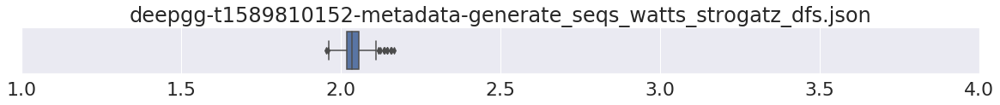

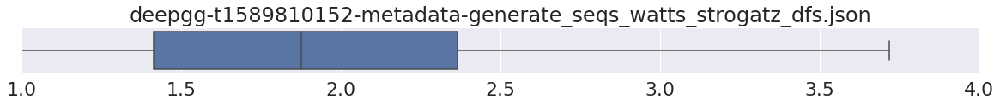

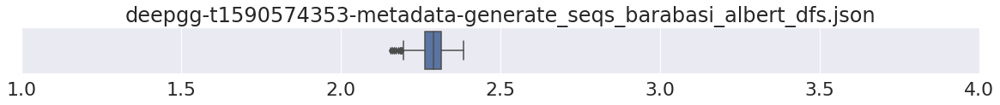

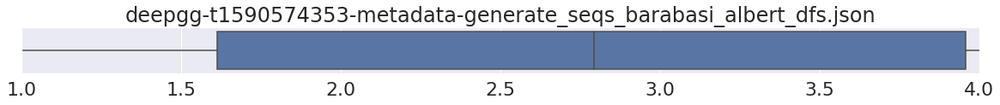

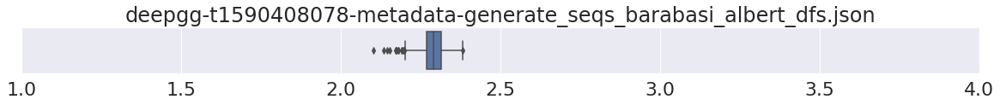

...

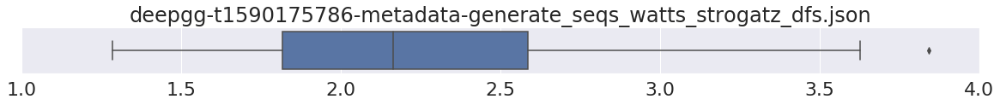

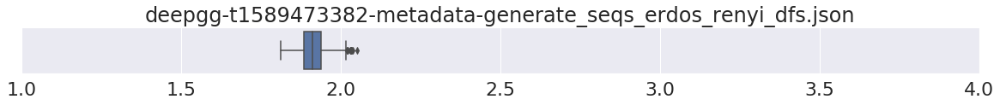

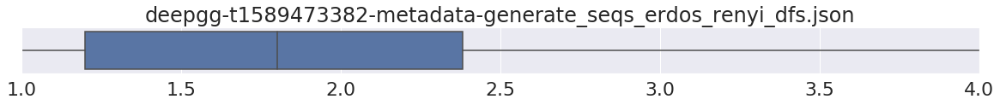

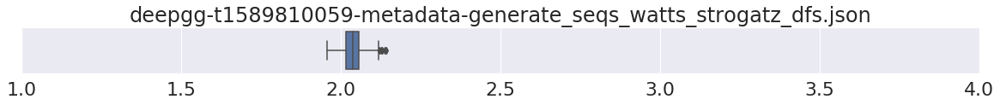

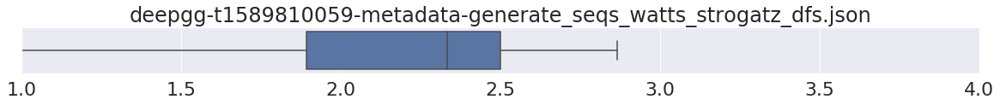

Visualizing for Breadth-First-Search


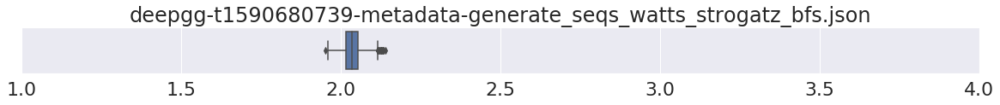

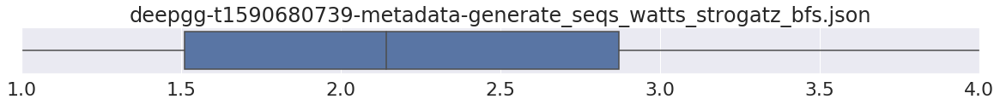

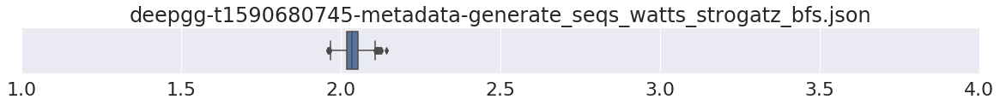

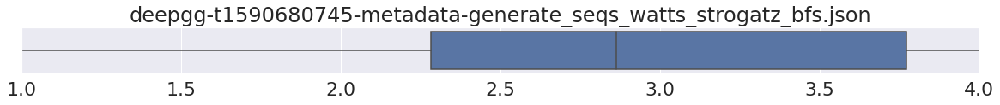

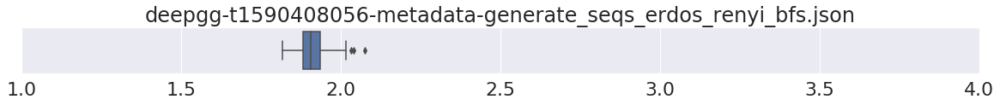

...

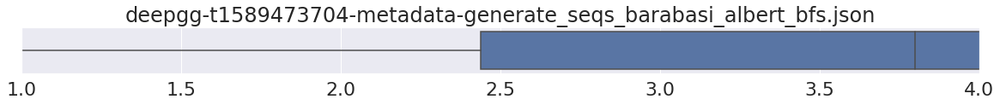

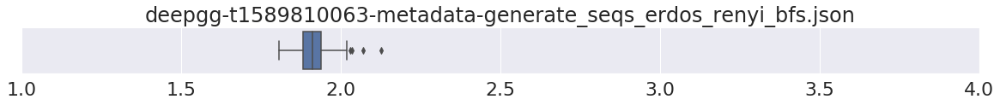

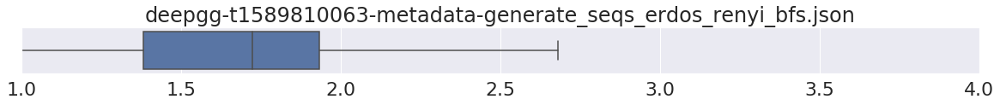

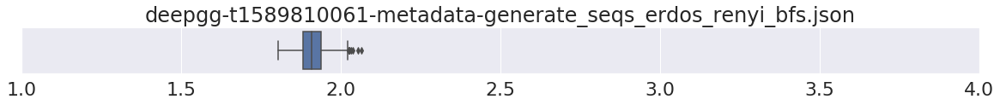

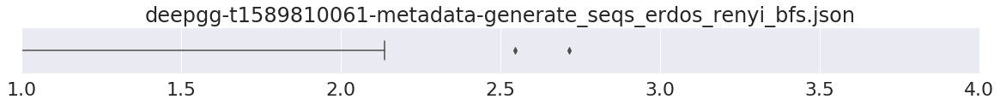

Visualizing for Construction Process


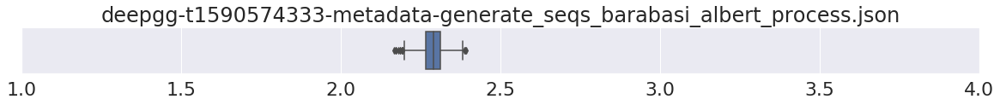

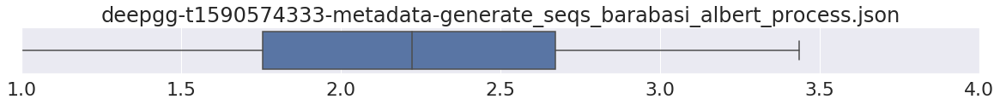

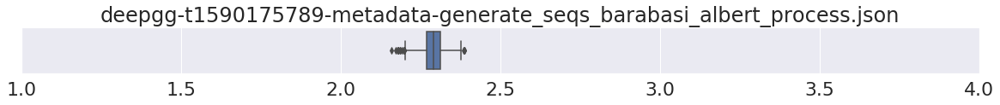

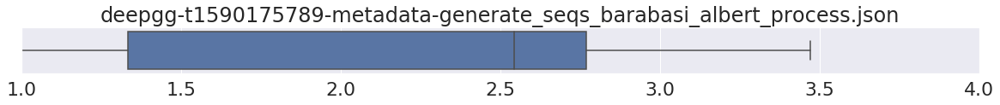

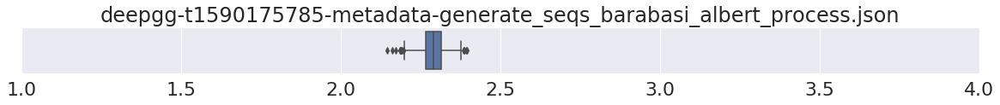

...

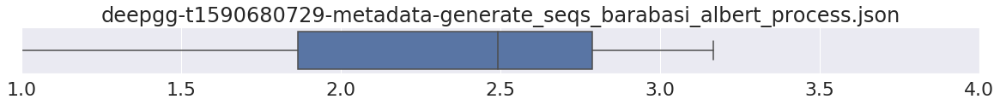

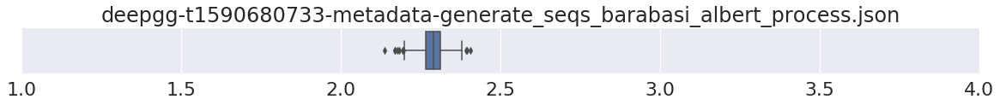

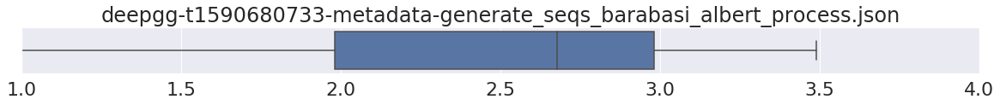

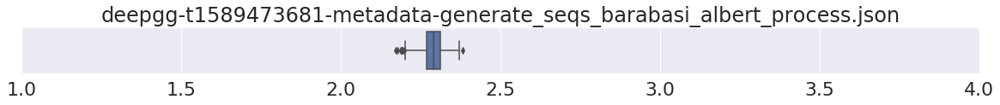

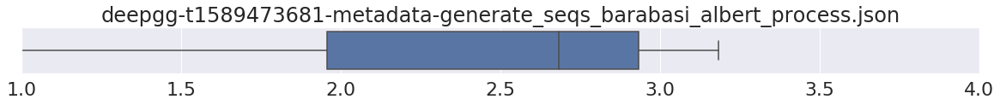

Visualizing for Erdos-Renyi model


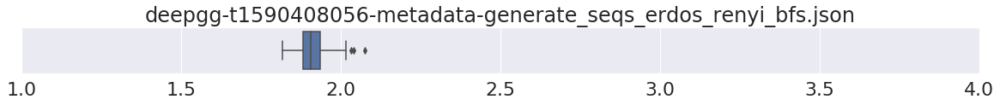

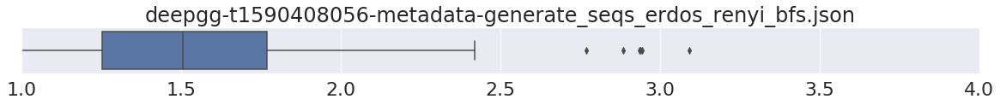

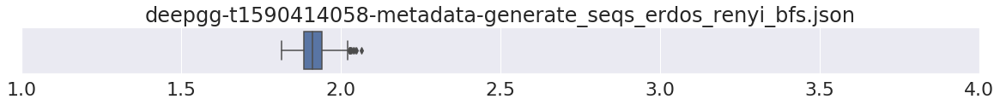

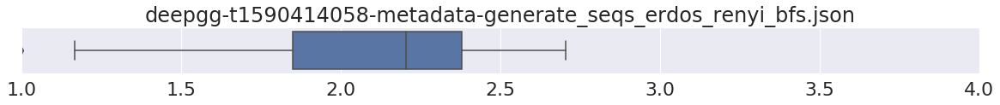

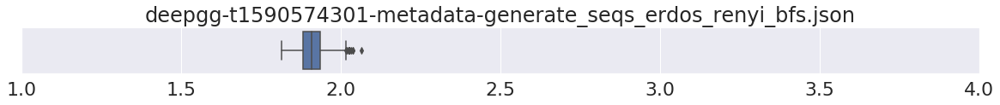

...

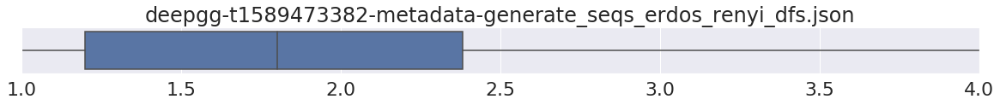

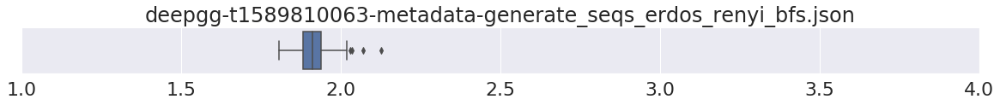

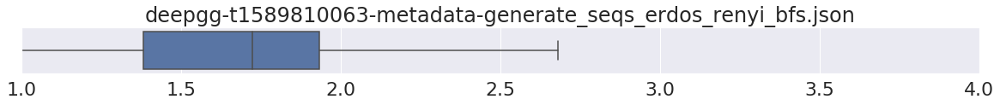

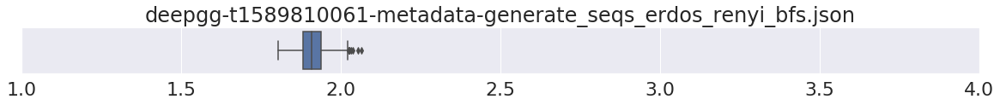

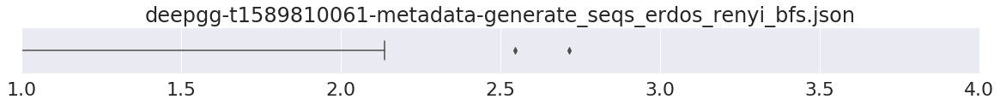

Visualizing for Barabasi-Albert model


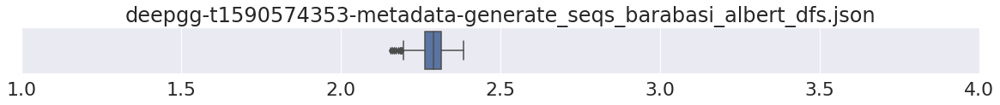

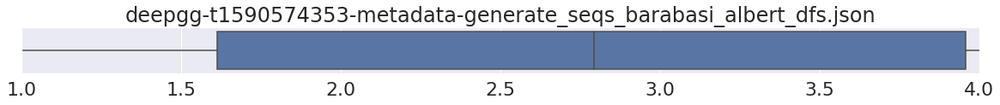

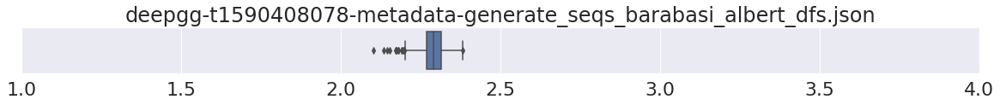

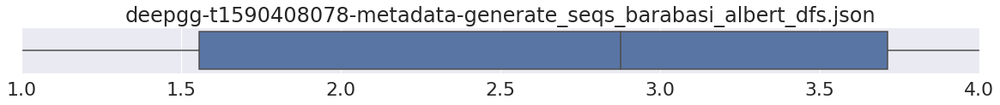

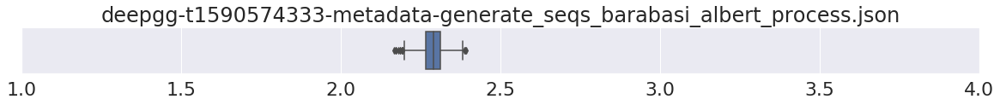

...

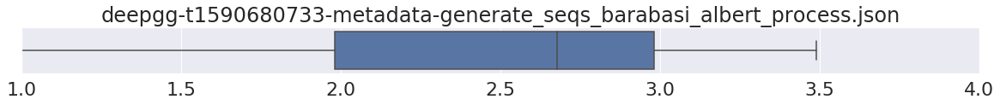

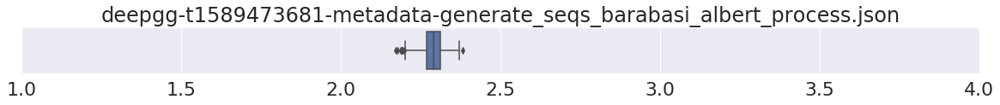

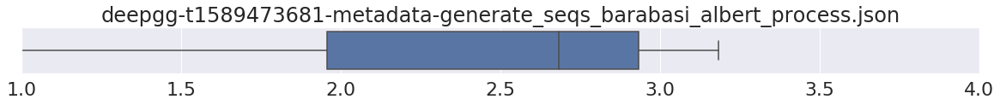

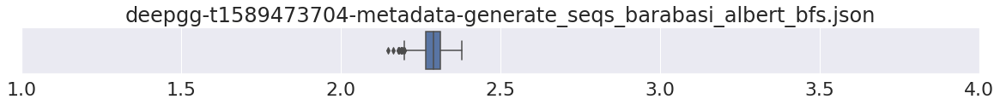

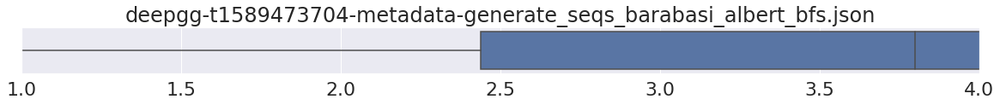

Visualizing for Watts-Strogatz model


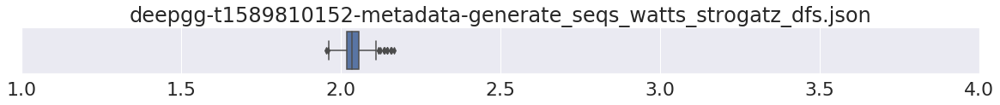

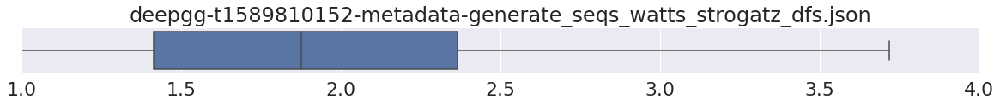

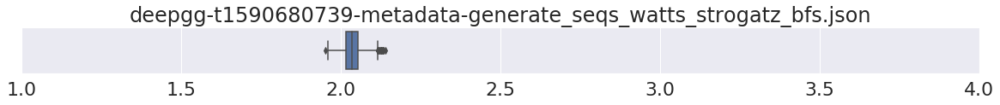

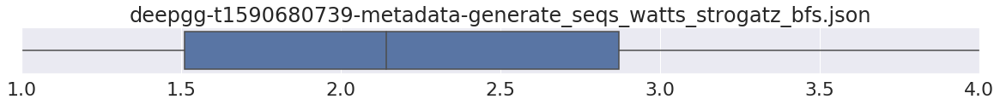

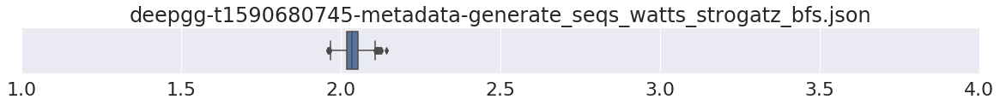

...

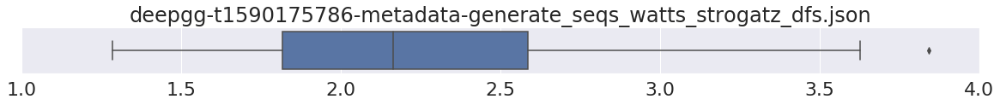

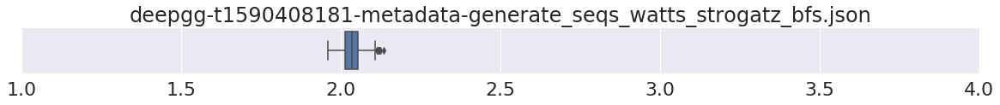

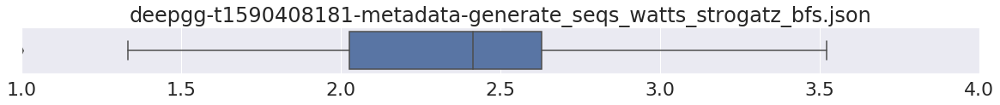

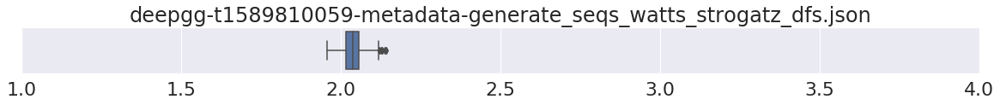

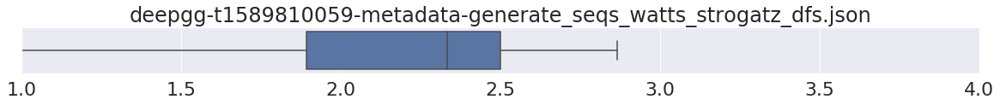

Visualizing for Erdos-Renyi + BFS


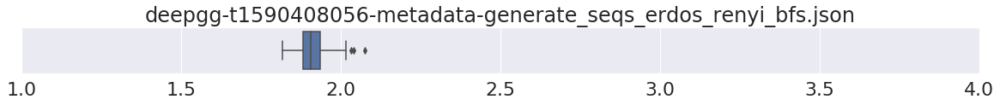

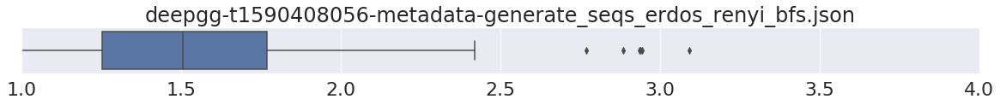

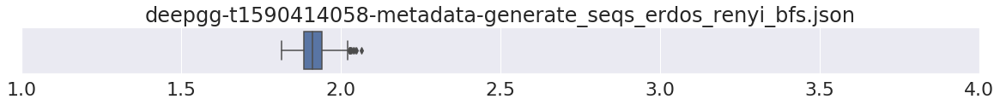

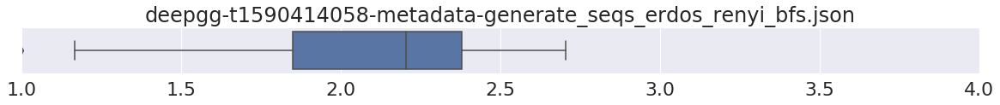

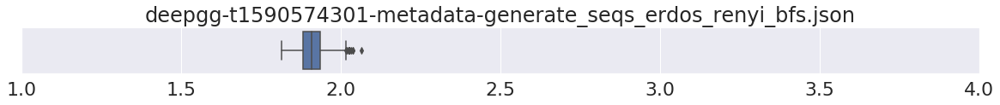

...

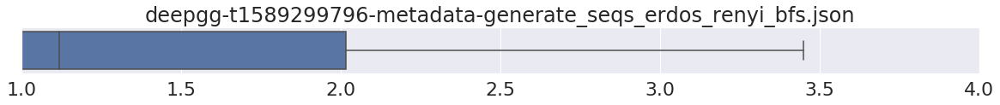

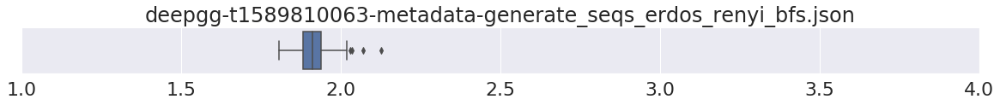

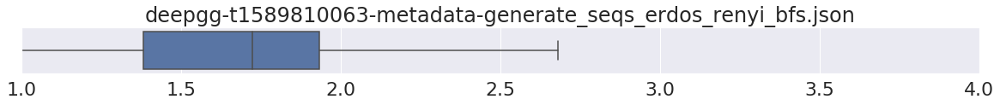

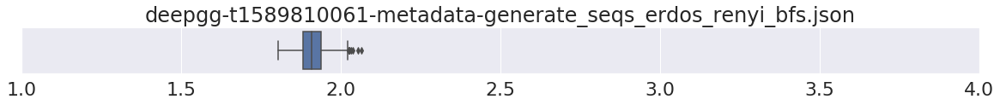

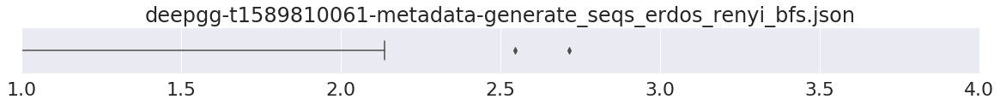

Visualizing for Erdos-Renyi + DFS


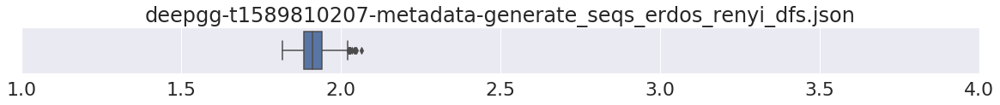

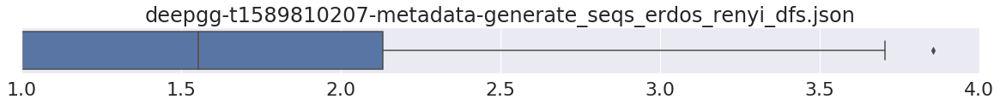

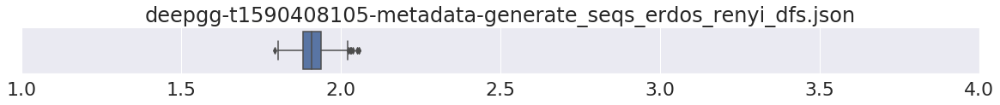

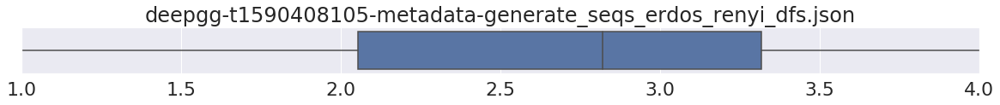

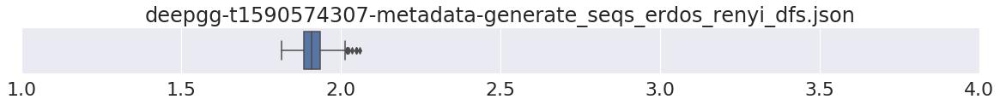

...

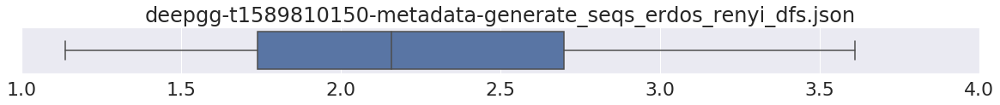

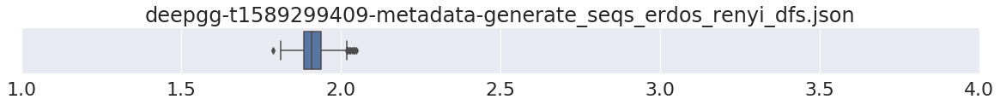

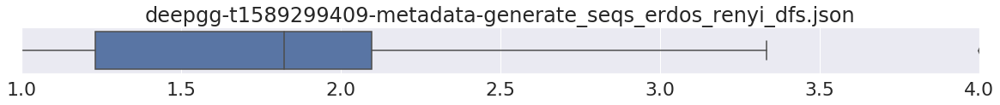

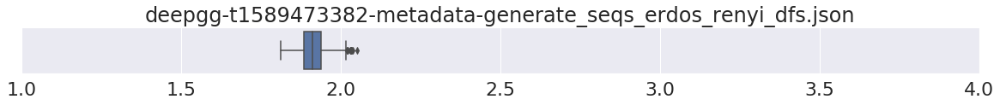

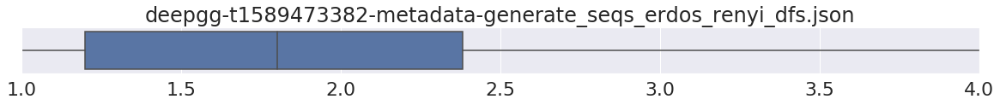

Visualizing for Barabasi-Albert + BFS


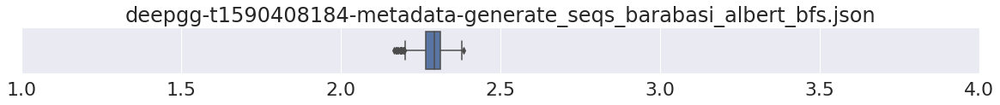

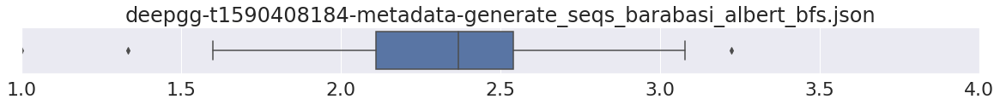

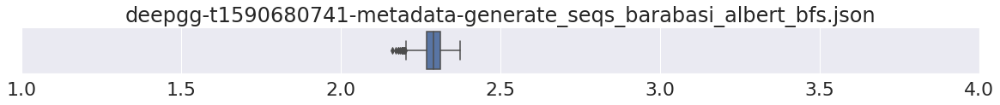

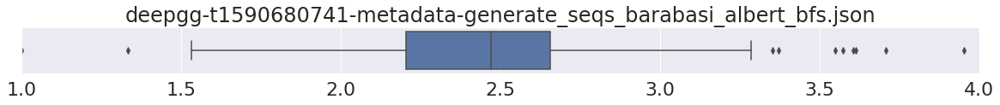

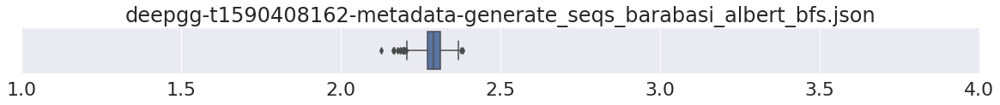

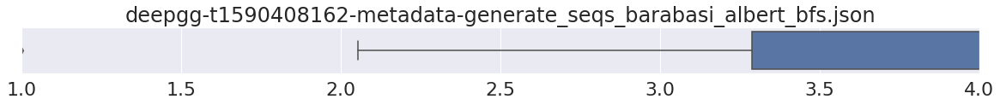

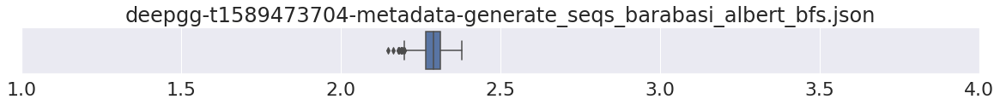

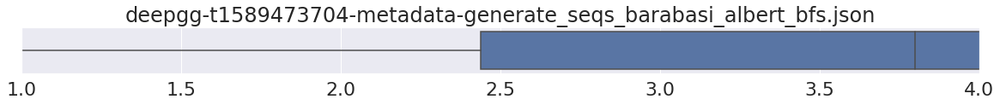

Visualizing for Barabasi-Albert + DFS


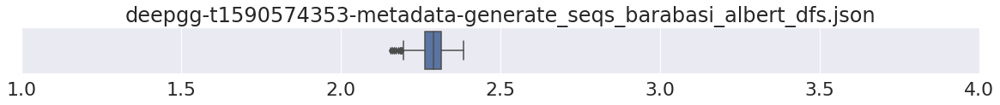

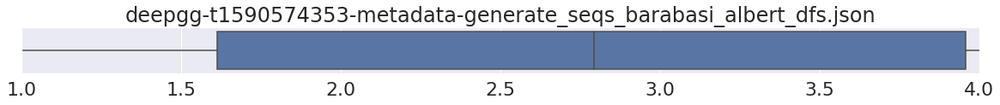

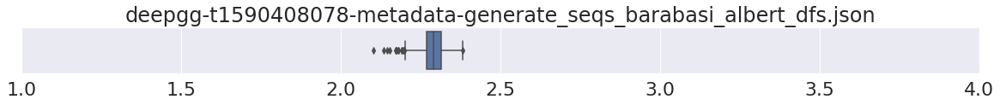

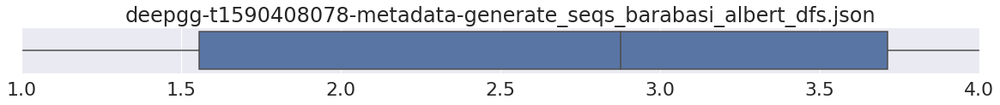

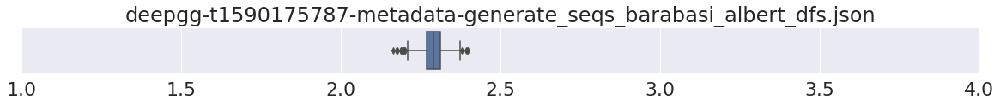

...

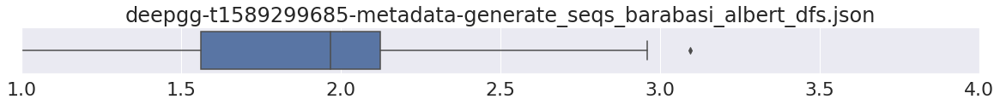

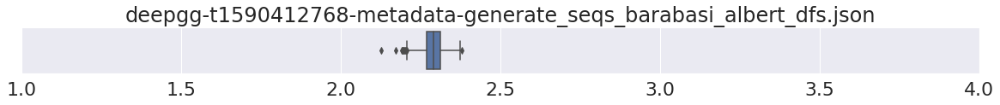

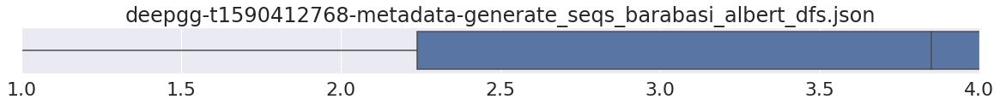

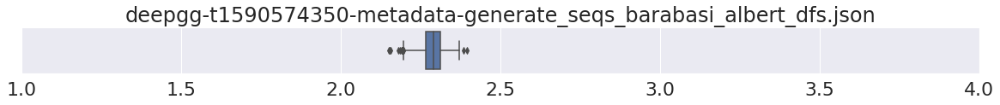

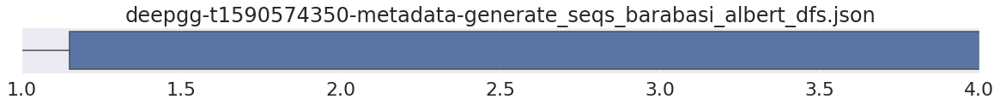

Visualizing for Watts-Strogatz + BFS


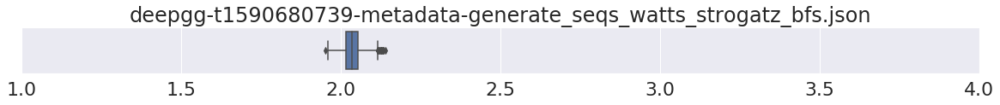

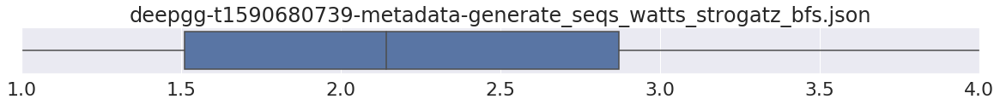

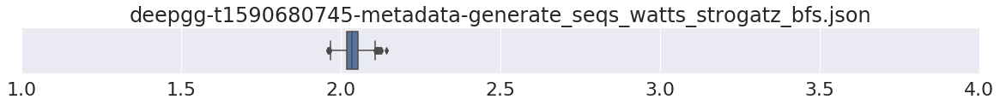

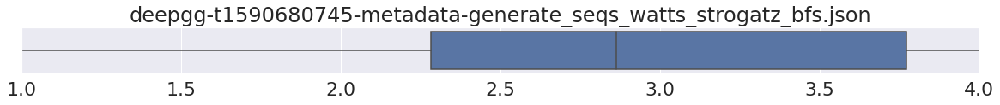

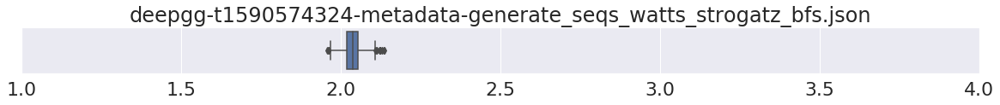

...

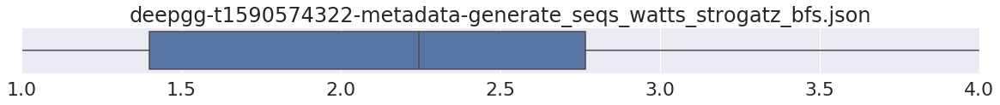

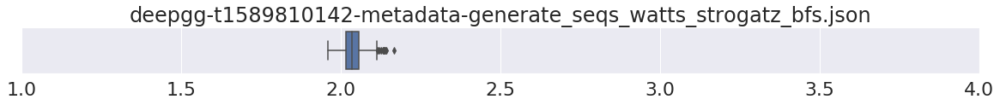

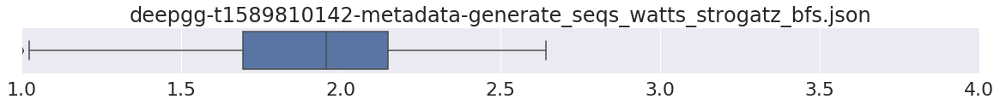

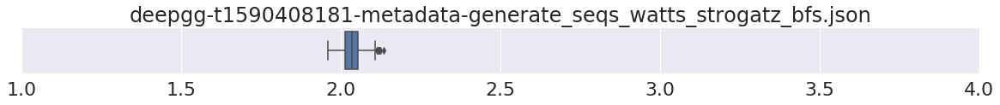

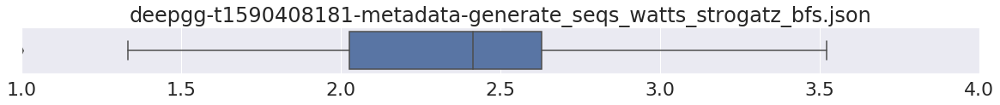

Visualizing for Watts-Strogatz + DFS


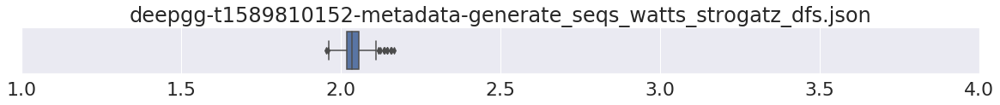

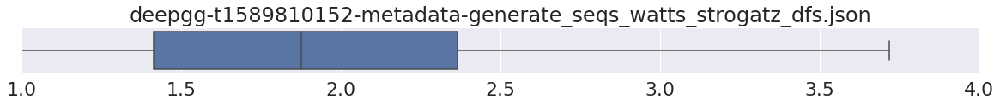

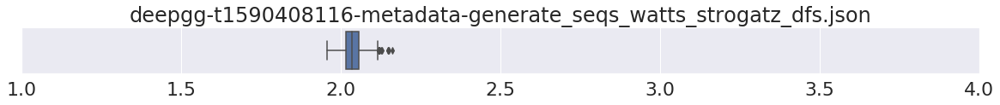

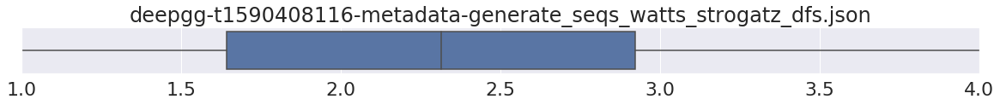

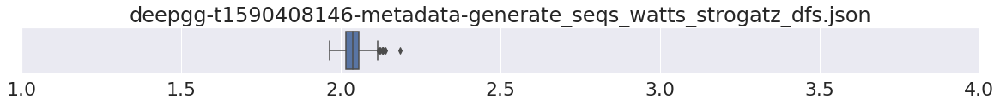

...

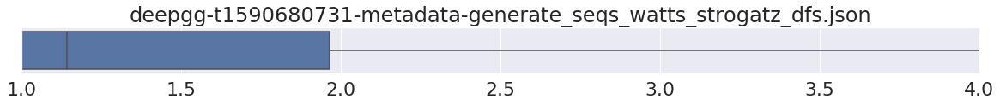

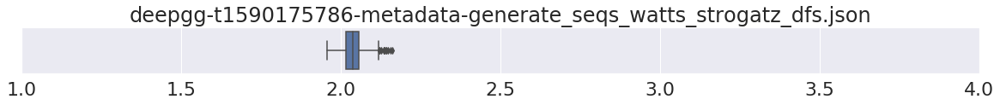

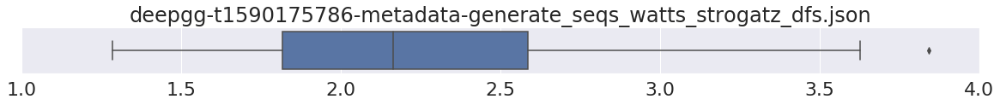

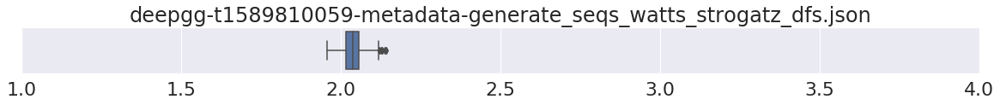

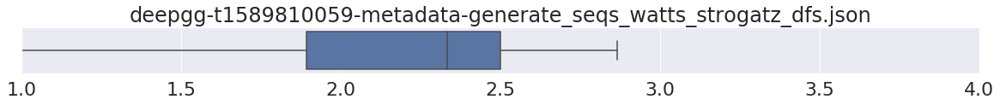

In [67]:
sns.set(style="whitegrid")
sns.set(font_scale=2)

for subset_name in subsets:
    print('Visualizing for', subset_name)
    
    subset = subsets[subset_name]
    
    for key in subset:
        distribution_dataset, distribution_generated = get_cached_avg_shortest_path_lengths(key)
    
        plt.figure(figsize=(20, 1))
        ax = sns.boxplot(distribution_dataset)
        ax.set_title('{name}'.format(name=key))
        ax.set(xlim=(1, 4))
        plt.show()

        plt.figure(figsize=(20, 1))
        ax = sns.boxplot(distribution_generated)
        ax.set_title('{name}'.format(name=key))
        ax.set(xlim=(1, 4))
        plt.show()

Visualizing for Depth-First-Search


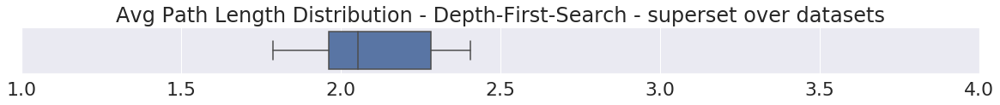

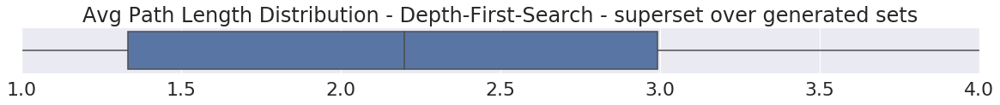

Visualizing for Breadth-First-Search


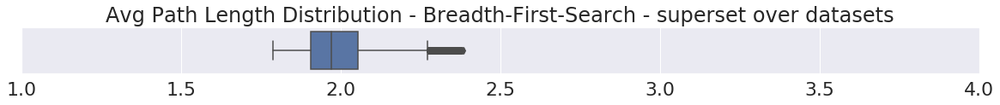

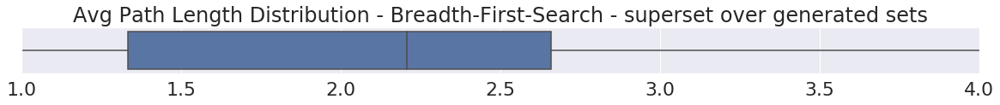

Visualizing for Construction Process


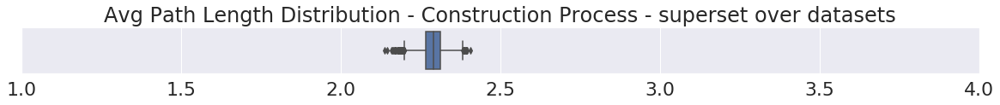

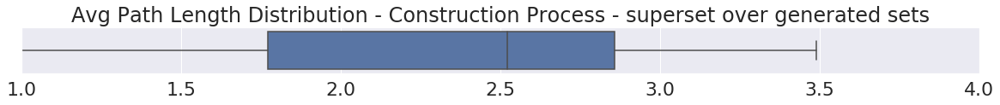

Visualizing for Erdos-Renyi model


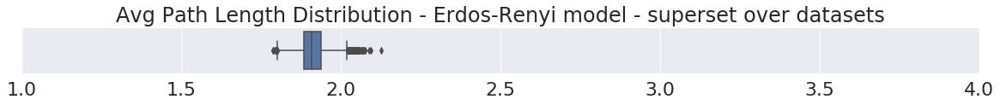

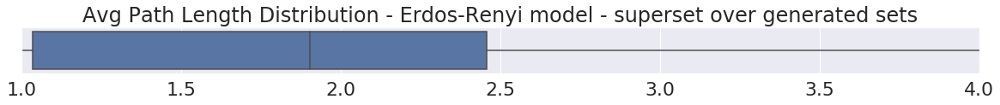

Visualizing for Barabasi-Albert model


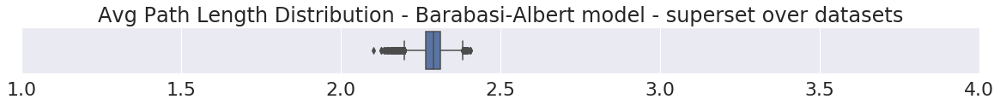

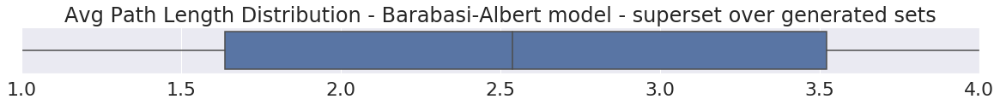

Visualizing for Watts-Strogatz model


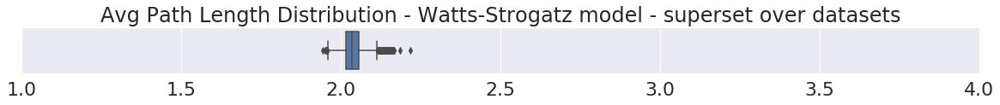

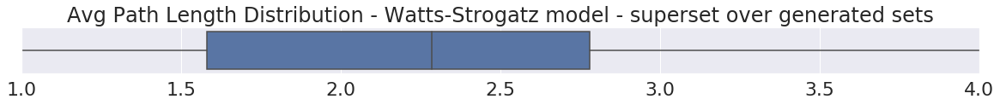

Visualizing for Erdos-Renyi + BFS


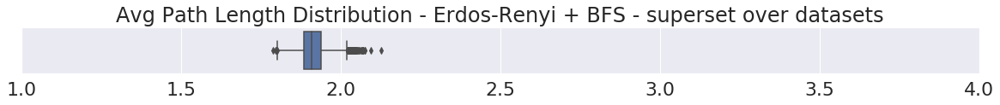

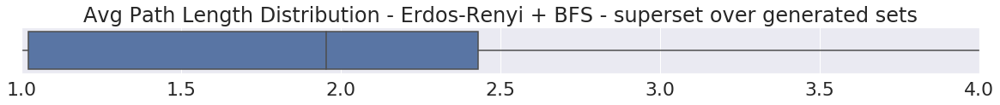

Visualizing for Erdos-Renyi + DFS


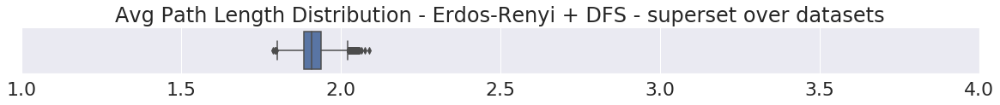

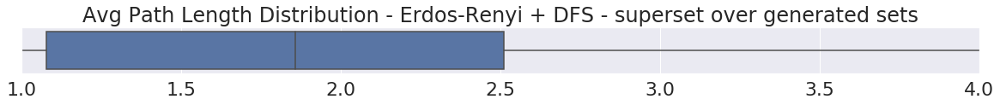

Visualizing for Barabasi-Albert + BFS


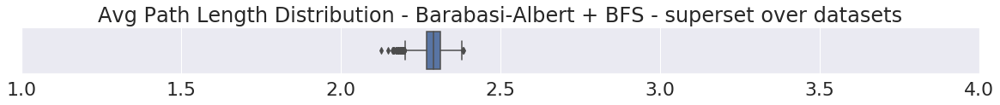

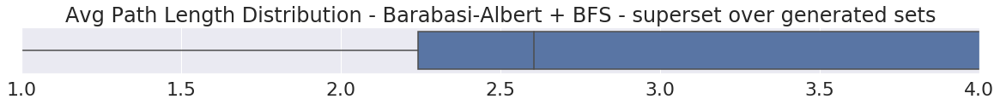

Visualizing for Barabasi-Albert + DFS


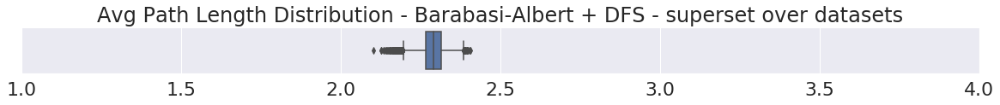

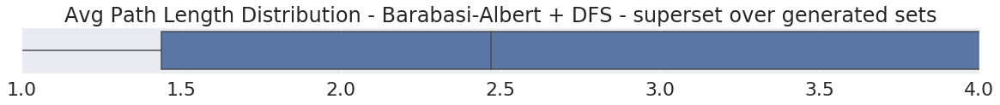

Visualizing for Watts-Strogatz + BFS


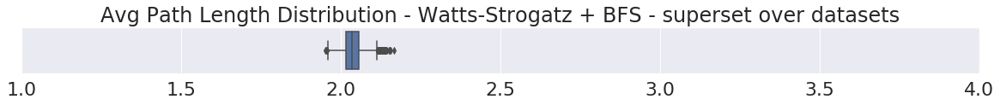

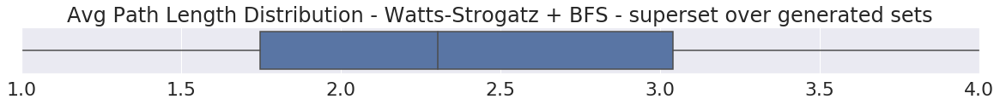

Visualizing for Watts-Strogatz + DFS


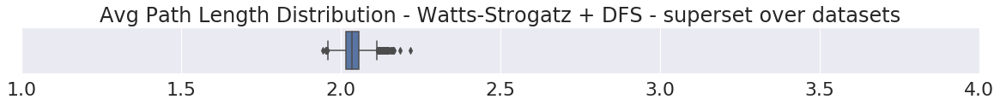

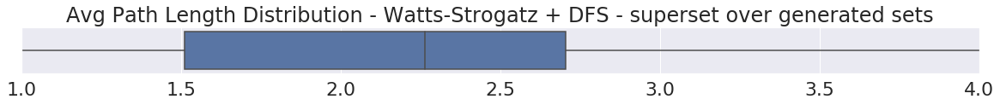

In [79]:
sns.set(style="whitegrid")
sns.set(font_scale=2)

for subset_name in subsets:
    print('Visualizing for', subset_name)
    
    subset = subsets[subset_name]
    
    superset_distribution_dataset = []
    superset_distribution_generated = []
    for key in subset:
        distribution_dataset, distribution_generated = get_cached_avg_shortest_path_lengths(key)
        superset_distribution_dataset.append(distribution_dataset)
        superset_distribution_generated.append(distribution_generated)
    
    plt.figure(figsize=(20, 1))
    ax = sns.boxplot(np.concatenate(superset_distribution_dataset))
    ax.set_title('Avg Path Length Distribution - {name} - superset over datasets'.format(name=subset_name))
    ax.set(xlim=(1, 4))
    plt.show()

    plt.figure(figsize=(20, 1))
    ax = sns.boxplot(np.concatenate(superset_distribution_generated))
    ax.set_title('Avg Path Length Distribution - {name} - superset over generated sets'.format(name=subset_name))
    ax.set(xlim=(1, 4))
    plt.show()

In [80]:
len(keys_ws_and_bfs)

7

In [83]:
[len(get_cached_avg_shortest_path_lengths(key)[0]) for key in keys_ws_and_bfs]

[1000, 1000, 1000, 1000, 1000, 1000, 1000]

In [85]:
[len(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_ws_and_bfs]

[170, 176, 170, 172, 169, 173, 169]

In [87]:
np.mean([len(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_ws_and_bfs])

171.28571428571428

In [88]:
np.sum([len(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_ws_and_bfs])

1199

In [81]:
len(keys_ws_and_dfs)

12

In [84]:
[len(get_cached_avg_shortest_path_lengths(key)[0]) for key in keys_ws_and_dfs]

[1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000]

In [86]:
[len(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_ws_and_dfs]

[171, 172, 174, 158, 174, 169, 168, 172, 173, 167, 173, 163]

In [89]:
np.sum([len(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_ws_and_dfs])

2034

In [15]:
# Averages over average shortest path lengths of erdos-renyi instances

In [27]:
len(get_cached_avg_shortest_path_lengths(keys[0])[0])

1000

In [25]:
np.mean([np.mean(get_cached_avg_shortest_path_lengths(key)[0]) for key in keys_erdos_renyi])

1.9129397732426303

In [17]:
np.mean([np.std(get_cached_avg_shortest_path_lengths(key)[0]) for key in keys_erdos_renyi])

0.04069117064038714

In [12]:
np.mean([np.mean(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_erdos_renyi])

1.752407479354036

In [20]:
np.mean([np.std(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_erdos_renyi])

0.9329804635712925

In [28]:
np.mean([np.mean(get_cached_avg_shortest_path_lengths(key)[0]) for key in keys_barabasi_albert])

2.2894051805337523

In [21]:
np.mean([np.std(get_cached_avg_shortest_path_lengths(key)[0]) for key in keys_barabasi_albert])

0.03521295652371174

In [22]:
np.mean([np.mean(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_barabasi_albert])

2.6050736443234923

In [23]:
np.mean([np.std(get_cached_avg_shortest_path_lengths(key)[1]) for key in keys_barabasi_albert])

1.4950185805791838